# Traffic-Sign Recognition Using SVM and HOG

**Support Vector Machine (SVM)**.

1. Load the clean Chinese traffic-sign HOG training and public-test features.
2. Create a stratified training/validation split.
3. Compare several SVM parameter combinations using validation macro F1-score and accuracy.
4. Select the best SVM parameters automatically.
5. Retrain the selected SVM using the complete training set.
6. Display 10 training results from the selected best SVM.
7. Evaluate the final SVM once on the public dataset test set.
8. Display 10 testing results from the selected best SVM.
9. Load the already-extracted HOG features for the 84 final testing images and classify them without extracting HOG again.
10. Use the raw testing images only for segmentation and result visualisation.
11. Display all final testing results at the end of the notebook.


## 1. Import libraries

In [1]:
import sys
from pathlib import Path

sys.path.insert(0, str(Path("..").resolve()))

from pipeline import annotations
from pipeline import features as pipeline_features
from pipeline import labels as pipeline_labels
from pipeline import paths as pipeline_paths
from time import perf_counter
import json
import warnings

import cv2
import joblib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from PIL import Image

from sklearn.metrics import (
    accuracy_score,
    classification_report,
    confusion_matrix,
    f1_score,
    precision_score,
    recall_score,
)
from sklearn.model_selection import (
    train_test_split,
    ParameterSampler
)
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC

RANDOM_STATE = 42
# Read from pipeline.features itself rather than hardcoding 1764, so this
# notebook can never silently drift out of sync with the actual HOG
# configuration the way a hardcoded literal did before.
EXPECTED_HOG_FEATURES = pipeline_features.expected_hog_dim()
MAX_SECONDS_PER_IMAGE = 2.0

np.random.seed(RANDOM_STATE)
pd.set_option("display.max_columns", None)
pd.set_option("display.width", 160)
sns.set_theme(style="whitegrid")

## 2. Set project paths


In [2]:
DATA_DIR = pipeline_paths.DATA_DIR
DATASET_DIR = pipeline_paths.DATASET_DIR
FEATURE_DIR = pipeline_paths.FEATURE_DIR
RESULT_DIR = pipeline_paths.RESULT_DIR
MODEL_DIR = pipeline_paths.MODEL_DIR

# Raw images are never moved out of DATASET_DIR (see
# 00-dataset/02_clean_annotations.ipynb) - the 84 held-out
# assignment-test images live there permanently alongside the training
# images, so there is no separate Inputs/ folder or backup-folder lookup
# to resolve here.
TRAIN_FEATURE_FILE = FEATURE_DIR / "chinese_traffic_signs_hog_features_train.npz"
TEST_FEATURE_FILE = FEATURE_DIR / "chinese_traffic_signs_hog_features_test.npz"
INPUT_TEST_FEATURE_FILE = FEATURE_DIR / "assignment1_test_hog_features.npz"

SVM_VALIDATION_FILE = RESULT_DIR / "svm_parameter_validation_results.csv"
FINAL_MODEL_FILE = MODEL_DIR / "svm_hog_final_classifier.joblib"
FINAL_METADATA_FILE = MODEL_DIR / "svm_hog_final_classifier_metadata.json"
FINAL_RESULTS_FILE = RESULT_DIR / "svm_final_84_image_results.csv"
FINAL_DISPLAY_DIR = RESULT_DIR / "svm_final_detection_displays"

MODEL_DIR.mkdir(parents=True, exist_ok=True)
RESULT_DIR.mkdir(parents=True, exist_ok=True)

required_paths = [
    DATASET_DIR,
    TRAIN_FEATURE_FILE,
    TEST_FEATURE_FILE,
    INPUT_TEST_FEATURE_FILE,
]
missing_paths = [path for path in required_paths if not path.exists()]

if missing_paths:
    missing_text = "\n".join(f"- {path.resolve()}" for path in missing_paths)
    raise FileNotFoundError(
        "The following required files or folders were not found:\n"
        f"{missing_text}\n\n"
        "Run the cleanup and HOG extraction notebooks first."
    )

print("All required project files were found.")

All required project files were found.


## 3. Load class names

In [3]:
# pipeline.labels.load_label_map() honors a real
# ../data/chinese_traffic_signs/labels.csv if present, else falls back to
# the numeric category id as the display label (this Kaggle dataset does
# not ship a labels.csv).
label_map = pipeline_labels.load_label_map()

print("Number of class names:", len(label_map))

Number of class names: 58


## 4. Load the clean HOG training and public-test features

In [4]:
train_data = np.load(TRAIN_FEATURE_FILE, allow_pickle=False)
test_data = np.load(TEST_FEATURE_FILE, allow_pickle=False)

X_train_full = train_data["X"].astype(np.float32, copy=False)
y_train_full = train_data["y"].astype(np.int64, copy=False)
train_filenames = train_data["filenames"].astype(str)

X_test = test_data["X"].astype(np.float32, copy=False)
y_test = test_data["y"].astype(np.int64, copy=False)
test_filenames = test_data["filenames"].astype(str)

if X_train_full.ndim != 2 or X_test.ndim != 2:
    raise ValueError("HOG feature matrices must be two-dimensional.")

if X_train_full.shape[1] != EXPECTED_HOG_FEATURES:
    raise ValueError(
        f"Expected {EXPECTED_HOG_FEATURES} HOG features, "
        f"but received {X_train_full.shape[1]}."
    )

if X_test.shape[1] != EXPECTED_HOG_FEATURES:
    raise ValueError("Public-test HOG dimensions do not match training dimensions.")

if not np.isfinite(X_train_full).all() or not np.isfinite(X_test).all():
    raise ValueError("NaN or infinite HOG values were found.")

print("Training features:", X_train_full.shape)
print("Public-test features:", X_test.shape)
print("Classes:", len(np.unique(y_train_full)))

Training features: (4730, 1764)
Public-test features: (1180, 1764)
Classes: 58


## 5. Confirm that testing filenames are absent from model-development data

In [5]:
held_out_filenames = annotations.held_out_filenames()

held_out_keys = {name.casefold() for name in held_out_filenames}
train_filename_keys = {name.casefold() for name in train_filenames}
test_filename_keys = {name.casefold() for name in test_filenames}

testing_train_overlap = sorted(held_out_keys & train_filename_keys)
testing_public_test_overlap = sorted(held_out_keys & test_filename_keys)

print("Held-out filenames:", len(held_out_filenames))
print("Held-out/train filename overlap:", len(testing_train_overlap))
print("Held-out/public-test filename overlap:", len(testing_public_test_overlap))

annotations.assert_no_leakage(held_out_filenames, train_filenames, test_filenames)
print("No leakage between the held-out set and the train/test features.")

Held-out filenames: 84
Held-out/train filename overlap: 0
Held-out/public-test filename overlap: 0
No leakage between the held-out set and the train/test features.


## 6. Define the red, blue and yellow segmentation functions

In [6]:
# pipeline.preprocessing.get_roi() is the exact same segment+mask routine
# 01-roi-segmentation and 02-feature-extraction use to build the HOG
# features loaded above - reusing it here (rather than a separate
# hand-rolled segmentation copy) means these visualizations show precisely
# what fed the classifier, not an approximation of it.
from pipeline import preprocessing as pipeline_preprocessing

## 7. Prepare segmented images for result visualisation


In [7]:
def prepare_segmented_display(image):
    """Same pipeline.preprocessing.get_roi() the feature-extraction
    notebooks call - not a separate hand-rolled segmentation copy - so this
    visualization matches exactly what fed the classifier's HOG features.
    get_roi() already blacks out the background; this only additionally
    crops to the mask's bounding box for a tighter display - the saved HOG
    features themselves are never cropped (see pipeline/preprocessing.py,
    pipeline/features.py)."""
    image_rgb = np.array(image.convert("RGB"))

    roi = pipeline_preprocessing.get_roi(image_rgb)

    if roi is None:
        return {
            "original": image_rgb,
            "segmented": image_rgb,
            "segmentation_found": False,
            "bounding_box": None,
        }

    roi_rgb, roi_mask = roi
    x, y, width, height = cv2.boundingRect(roi_mask)
    width = max(1, width)
    height = max(1, height)

    segmented_roi = roi_rgb[y:y + height, x:x + width]

    if segmented_roi.size == 0:
        return {
            "original": image_rgb,
            "segmented": image_rgb,
            "segmentation_found": False,
            "bounding_box": None,
        }

    return {
        "original": image_rgb,
        "segmented": segmented_roi,
        "segmentation_found": True,
        "bounding_box": (x, y, width, height),
    }

## 8. Prepare the best-SVM image-result visualisation


In [8]:
# Locate all original Chinese traffic-sign images.
dataset_image_paths = annotations.list_dataset_images()

dataset_image_lookup = {
    path.name.casefold(): path
    for path in dataset_image_paths
}


def prepare_best_svm_visuals(
    features,
    labels,
    filenames,
    number_of_results=10,
    random_state=42,
):
    # Select only entries whose original image can be found.
    available_indices = np.array([
        index
        for index, filename in enumerate(filenames)
        if Path(str(filename)).name.casefold() in dataset_image_lookup
    ])

    if len(available_indices) == 0:
        raise RuntimeError("No original dataset images could be matched to filenames.")

    number_to_display = min(number_of_results, len(available_indices))
    random_generator = np.random.default_rng(random_state)
    selected_indices = random_generator.choice(
        available_indices,
        size=number_to_display,
        replace=False,
    )

    selected_predictions = final_model.predict(features[selected_indices])
    visual_results = []

    for data_index, prediction in zip(selected_indices, selected_predictions):
        filename = Path(str(filenames[data_index])).name
        image_path = dataset_image_lookup[filename.casefold()]

        with Image.open(image_path) as image:
            extraction = prepare_segmented_display(
                image.convert("RGB")
            )

        actual_class = int(labels[data_index])
        predicted_class = int(prediction)

        visual_results.append({
            "filename": filename,
            "original": extraction["original"],
            "segmented": extraction["segmented"],
            "actual_class": actual_class,
            "actual_name": label_map.get(
                actual_class,
                f"Class {actual_class}",
            ),
            "predicted_class": predicted_class,
            "predicted_name": label_map.get(
                predicted_class,
                f"Class {predicted_class}",
            ),
            "correct": predicted_class == actual_class,
            "segmentation_found": extraction["segmentation_found"],
        })

    return visual_results


def display_best_svm_visuals(visual_results, figure_title):
    total_results = len(visual_results)

    if total_results == 0:
        raise RuntimeError("No recognition results are available.")

    fig, axes = plt.subplots(
        total_results,
        2,
        figsize=(6, 2.2 * total_results),
        squeeze=False,
        facecolor="white",
    )

    for row_index, result in enumerate(visual_results):
        axes[row_index, 0].imshow(result["original"])
        axes[row_index, 0].set_title(
            f"Original - {result['filename']}",
            color="black",
            fontsize=8,
        )
        axes[row_index, 0].set_facecolor("white")
        axes[row_index, 0].axis("off")

        status = "Correct" if result["correct"] else "Wrong"
        colour = "green" if result["correct"] else "red"

        axes[row_index, 1].imshow(result["segmented"])
        axes[row_index, 1].set_title(
            f"{result['predicted_name']}\n"
            f"Class {result['predicted_class']} - {status}",
            color=colour,
            fontsize=8,
        )
        axes[row_index, 1].set_facecolor("white")
        axes[row_index, 1].axis("off")

    fig.suptitle(
        figure_title,
        color="black",
        fontsize=11,
    )
    plt.tight_layout(rect=[0, 0, 1, 0.99])
    plt.show()


print("Dataset images available for visualisation:", len(dataset_image_lookup))


Dataset images available for visualisation: 5998


## 9. Create a validation split and define SVM candidates

In [9]:
def calculate_metrics(y_true, y_pred):
    return {
        "Accuracy": accuracy_score(y_true, y_pred),
        "Macro Precision": precision_score(
            y_true, y_pred, average="macro", zero_division=0
        ),
        "Macro Recall": recall_score(
            y_true, y_pred, average="macro", zero_division=0
        ),
        "Macro F1": f1_score(
            y_true, y_pred, average="macro", zero_division=0
        ),
    }


# The public test set is not used for parameter selection.
X_train, X_validation, y_train, y_validation = train_test_split(
    X_train_full,
    y_train_full,
    test_size=0.20,
    random_state=RANDOM_STATE,
    stratify=y_train_full,
)

# These candidates test linear and non-linear decision boundaries.
svm_search_space = [
    {
        "kernel": ["linear"],
        "C": [0.01, 0.1, 0.3, 1, 3, 10, 30, 100],
        "class_weight": [None, "balanced"]
    },
    {
        "kernel": ["rbf"],
        "C": [0.1, 0.3, 1, 3, 10, 30, 100],
        "gamma": [
            "scale",
            0.0001,
            0.0003,
            0.001,
            0.003,
            0.01
        ],
        "class_weight": [None, "balanced"]
    }
]

SVM_CANDIDATES = list(
    ParameterSampler(
        svm_search_space,
        n_iter=12,
        random_state=RANDOM_STATE
    )
)

print("Parameter-selection training samples:", len(X_train))
print("Validation samples:", len(X_validation))
print("SVM candidates:", len(SVM_CANDIDATES))


Parameter-selection training samples: 3784
Validation samples: 946
SVM candidates: 12


## 10. Tune SVM and retrain the best SVM

In [10]:
svm_validation_rows = []

for candidate_number, parameters in enumerate(SVM_CANDIDATES, start=1):
    svm_pipeline = Pipeline([
        ("scaler", StandardScaler()),
        (
            "classifier",
            SVC(
                probability=False,
                cache_size=512,
                random_state=RANDOM_STATE,
                **parameters,
            ),
        ),
    ])

    training_start = perf_counter()
    svm_pipeline.fit(X_train, y_train)
    training_seconds = perf_counter() - training_start

    prediction_start = perf_counter()
    validation_predictions = svm_pipeline.predict(X_validation)
    prediction_seconds = perf_counter() - prediction_start

    scores = calculate_metrics(y_validation, validation_predictions)

    svm_validation_rows.append({
        "Candidate": candidate_number,
        "Kernel": parameters["kernel"],
        "C": parameters["C"],
        "Gamma": parameters.get("gamma", "not used"),
        "Class Weight": str(parameters["class_weight"]),
        **scores,
        "Training Time (s)": training_seconds,
        "Prediction Time per Image (ms)": (
            prediction_seconds / len(X_validation)
        ) * 1000,
        "Parameters": str(parameters),
    })

/home/hongye/projects/traffic-sign-recognition/.venv/lib/python3.13/site-packages/sklearn/svm/_base.py:239: FutureWarning: The `probability` parameter was deprecated in 1.9 and will be removed in version 1.11. Use `CalibratedClassifierCV(SVC(), ensemble=False)` instead of `SVC(probability=True)`
  warnings.warn(


/home/hongye/projects/traffic-sign-recognition/.venv/lib/python3.13/site-packages/sklearn/svm/_base.py:239: FutureWarning: The `probability` parameter was deprecated in 1.9 and will be removed in version 1.11. Use `CalibratedClassifierCV(SVC(), ensemble=False)` instead of `SVC(probability=True)`
  warnings.warn(


/home/hongye/projects/traffic-sign-recognition/.venv/lib/python3.13/site-packages/sklearn/svm/_base.py:239: FutureWarning: The `probability` parameter was deprecated in 1.9 and will be removed in version 1.11. Use `CalibratedClassifierCV(SVC(), ensemble=False)` instead of `SVC(probability=True)`
  warnings.warn(


/home/hongye/projects/traffic-sign-recognition/.venv/lib/python3.13/site-packages/sklearn/svm/_base.py:239: FutureWarning: The `probability` parameter was deprecated in 1.9 and will be removed in version 1.11. Use `CalibratedClassifierCV(SVC(), ensemble=False)` instead of `SVC(probability=True)`
  warnings.warn(


/home/hongye/projects/traffic-sign-recognition/.venv/lib/python3.13/site-packages/sklearn/svm/_base.py:239: FutureWarning: The `probability` parameter was deprecated in 1.9 and will be removed in version 1.11. Use `CalibratedClassifierCV(SVC(), ensemble=False)` instead of `SVC(probability=True)`
  warnings.warn(


/home/hongye/projects/traffic-sign-recognition/.venv/lib/python3.13/site-packages/sklearn/svm/_base.py:239: FutureWarning: The `probability` parameter was deprecated in 1.9 and will be removed in version 1.11. Use `CalibratedClassifierCV(SVC(), ensemble=False)` instead of `SVC(probability=True)`
  warnings.warn(


/home/hongye/projects/traffic-sign-recognition/.venv/lib/python3.13/site-packages/sklearn/svm/_base.py:239: FutureWarning: The `probability` parameter was deprecated in 1.9 and will be removed in version 1.11. Use `CalibratedClassifierCV(SVC(), ensemble=False)` instead of `SVC(probability=True)`
  warnings.warn(


/home/hongye/projects/traffic-sign-recognition/.venv/lib/python3.13/site-packages/sklearn/svm/_base.py:239: FutureWarning: The `probability` parameter was deprecated in 1.9 and will be removed in version 1.11. Use `CalibratedClassifierCV(SVC(), ensemble=False)` instead of `SVC(probability=True)`
  warnings.warn(


/home/hongye/projects/traffic-sign-recognition/.venv/lib/python3.13/site-packages/sklearn/svm/_base.py:239: FutureWarning: The `probability` parameter was deprecated in 1.9 and will be removed in version 1.11. Use `CalibratedClassifierCV(SVC(), ensemble=False)` instead of `SVC(probability=True)`
  warnings.warn(


/home/hongye/projects/traffic-sign-recognition/.venv/lib/python3.13/site-packages/sklearn/svm/_base.py:239: FutureWarning: The `probability` parameter was deprecated in 1.9 and will be removed in version 1.11. Use `CalibratedClassifierCV(SVC(), ensemble=False)` instead of `SVC(probability=True)`
  warnings.warn(


/home/hongye/projects/traffic-sign-recognition/.venv/lib/python3.13/site-packages/sklearn/svm/_base.py:239: FutureWarning: The `probability` parameter was deprecated in 1.9 and will be removed in version 1.11. Use `CalibratedClassifierCV(SVC(), ensemble=False)` instead of `SVC(probability=True)`
  warnings.warn(


/home/hongye/projects/traffic-sign-recognition/.venv/lib/python3.13/site-packages/sklearn/svm/_base.py:239: FutureWarning: The `probability` parameter was deprecated in 1.9 and will be removed in version 1.11. Use `CalibratedClassifierCV(SVC(), ensemble=False)` instead of `SVC(probability=True)`
  warnings.warn(


In [11]:
svm_validation_df = pd.DataFrame(svm_validation_rows).sort_values(
    by=["Accuracy", "Macro F1", "Prediction Time per Image (ms)"],
    ascending=[False, False, True],
).reset_index(drop=True)

display(svm_validation_df.round(4))
svm_validation_df.to_csv(SVM_VALIDATION_FILE, index=False)

,Candidate,Kernel,C,Gamma,Class Weight,Accuracy,Macro Precision,Macro Recall,Macro F1,Training Time (s),Prediction Time per Image (ms),Parameters
0,9,linear,10.00,not used,None,0.9651,0.9473,0.9315,0.9351,5.4444,1.8172,"{'kernel': 'linear', 'class_weight': None, 'C'..."
1,10,linear,0.01,not used,None,0.9651,0.9473,0.9315,0.9351,5.4012,1.8297,"{'kernel': 'linear', 'class_weight': None, 'C'..."
2,1,rbf,30.00,0.0001,balanced,0.9641,0.9495,0.9309,0.9358,6.4690,2.9317,"{'kernel': 'rbf', 'gamma': 0.0001, 'class_weig..."
3,3,rbf,10.00,scale,balanced,0.9577,0.9505,0.9057,0.9243,8.8138,3.0127,"{'kernel': 'rbf', 'gamma': 'scale', 'class_wei..."
4,2,rbf,3.00,0.0001,None,0.9545,0.9012,0.8740,0.8845,6.5907,3.1373,"{'kernel': 'rbf', 'gamma': 0.0001, 'class_weig..."
5,8,rbf,30.00,0.003,None,0.8636,0.9518,0.7921,0.8506,14.8537,3.3095,"{'kernel': 'rbf', 'gamma': 0.003, 'class_weigh..."
6,5,rbf,1.00,0.003,None,0.8636,0.9518,0.7921,0.8506,16.0184,4.0849,"{'kernel': 'rbf', 'gamma': 0.003, 'class_weigh..."
7,12,rbf,0.30,0.0003,None,0.7886,0.6871,0.5286,0.5675,10.2183,4.3911,"{'kernel': 'rbf', 'gamma': 0.0003, 'class_weig..."
8,4,rbf,1.00,0.01,None,0.7685,0.9345,0.7168,0.7934,17.7072,4.8800,"{'kernel': 'rbf', 'gamma': 0.01, 'class_weight..."
9,7,rbf,0.10,scale,balanced,0.6385,0.8423,0.7039,0.7226,23.3290,5.1182,"{'kernel': 'rbf', 'gamma': 'scale', 'class_wei..."


In [12]:
best_candidate_number = int(svm_validation_df.iloc[0]["Candidate"])
best_parameters = SVM_CANDIDATES[best_candidate_number - 1]
best_classifier_name = "SVM"

print("Selected classifier: SVM")
print("Selected parameters:", best_parameters)
print("Validation accuracy:", f"{svm_validation_df.iloc[0]['Accuracy']:.4f}")
print("Validation macro F1:", f"{svm_validation_df.iloc[0]['Macro F1']:.4f}")

Selected classifier: SVM
Selected parameters: {'kernel': 'linear', 'class_weight': None, 'C': 10}
Validation accuracy: 0.9651
Validation macro F1: 0.9351


In [13]:
# StandardScaler is fitted inside the pipeline using training data only.
final_model = Pipeline([
    ("scaler", StandardScaler()),
    (
        "classifier",
        SVC(
            probability=False,
            cache_size=512,
            random_state=RANDOM_STATE,
            **best_parameters,
        ),
    ),
])

training_start = perf_counter()
final_model.fit(X_train_full, y_train_full)
final_training_seconds = perf_counter() - training_start

print("Final SVM training completed.")
print("Full training samples:", len(X_train_full))
print("Training time:", f"{final_training_seconds:.4f} seconds")

/home/hongye/projects/traffic-sign-recognition/.venv/lib/python3.13/site-packages/sklearn/svm/_base.py:239: FutureWarning: The `probability` parameter was deprecated in 1.9 and will be removed in version 1.11. Use `CalibratedClassifierCV(SVC(), ensemble=False)` instead of `SVC(probability=True)`
  warnings.warn(


Final SVM training completed.
Full training samples: 4730
Training time: 8.1348 seconds


## 11. Confusion matrix of training

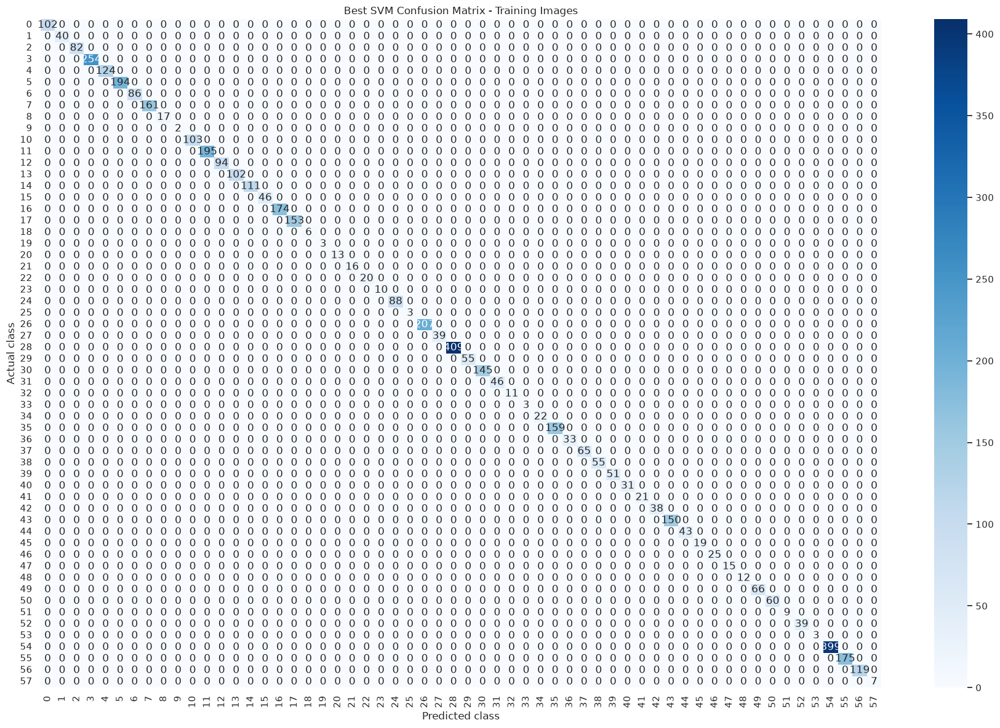

In [14]:
# Predict the complete training dataset
y_train_pred = final_model.predict(X_train_full)

# Obtain all classes in the training dataset
training_classes = np.unique(y_train_full)

# Generate the training confusion matrix
training_cm = confusion_matrix(
    y_train_full,
    y_train_pred,
    labels=training_classes,
)

# Display the confusion matrix
plt.figure(figsize=(18, 12))

sns.heatmap(
    training_cm,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=training_classes,
    yticklabels=training_classes,
)

plt.title("Best SVM Confusion Matrix - Training Images")
plt.xlabel("Predicted class")
plt.ylabel("Actual class")
plt.tight_layout()
plt.show()

## Display 10 training results from the best SVM


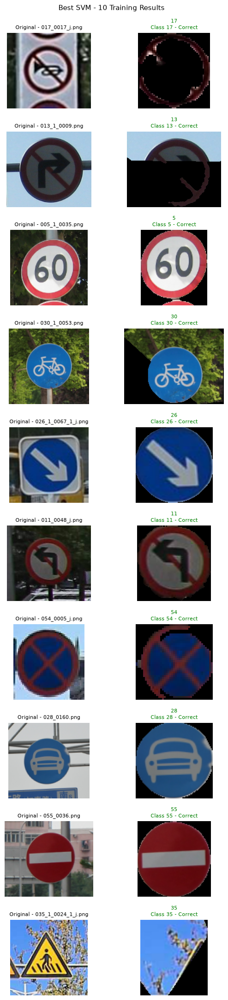

In [15]:
best_svm_training_visuals = prepare_best_svm_visuals(
    features=X_train_full,
    labels=y_train_full,
    filenames=train_filenames,
    number_of_results=10,
    random_state=42,
)

display_best_svm_visuals(
    best_svm_training_visuals,
    "Best SVM - 10 Training Results",
)


## 12. Evaluate the final SVM on the public dataset test set

In [16]:
public_test_start = perf_counter()
y_test_pred = final_model.predict(X_test)
public_test_seconds = perf_counter() - public_test_start
public_test_ms_per_image = (public_test_seconds / len(X_test)) * 1000

public_test_scores = calculate_metrics(y_test, y_test_pred)

print("Final SVM Public-Dataset Test Results")
print("-------------------------------------")
print("Parameters       :", best_parameters)
for metric_name, metric_value in public_test_scores.items():
    print(f"{metric_name:17s}: {metric_value:.4f}")
print(f"Prediction time   : {public_test_seconds:.4f} seconds")
print(f"Time per image    : {public_test_ms_per_image:.4f} ms")


Final SVM Public-Dataset Test Results
-------------------------------------
Parameters       : {'kernel': 'linear', 'class_weight': None, 'C': 10}
Accuracy         : 0.9839
Macro Precision  : 0.9890
Macro Recall     : 0.9664
Macro F1         : 0.9726
Prediction time   : 2.3065 seconds
Time per image    : 1.9546 ms


In [17]:
all_classes = np.unique(np.concatenate([y_train_full, y_test]))

public_report_df = pd.DataFrame(
    classification_report(
        y_test,
        y_test_pred,
        labels=all_classes,
        target_names=[label_map.get(int(c), f"Class {c}") for c in all_classes],
        output_dict=True,
        zero_division=0,
    )
).transpose()

display(public_report_df.round(4))
public_report_df.to_csv(RESULT_DIR / "svm_final_public_test_classification_report.csv")

,precision,recall,f1-score,support
0,1.0000,0.9231,0.9600,26.0000
1,1.0000,1.0000,1.0000,10.0000
2,0.8333,1.0000,0.9091,20.0000
3,0.9403,1.0000,0.9692,63.0000
4,1.0000,0.9355,0.9667,31.0000
...,...,...,...,...
56,0.9677,1.0000,0.9836,30.0000
57,1.0000,1.0000,1.0000,2.0000
accuracy,0.9839,0.9839,0.9839,0.9839
macro avg,0.9549,0.9330,0.9391,1180.0000


## 13. Display 10 testing results from the best SVM


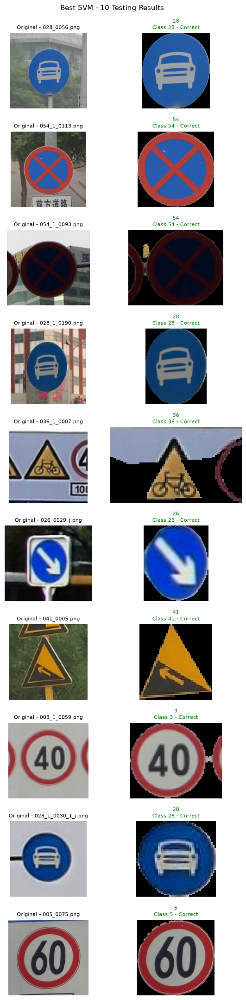

In [18]:
best_svm_testing_visuals = prepare_best_svm_visuals(
    features=X_test,
    labels=y_test,
    filenames=test_filenames,
    number_of_results=10,
    random_state=43,
)

display_best_svm_visuals(
    best_svm_testing_visuals,
    "Best SVM - 10 Testing Results",
)


## 14. Load the already-extracted HOG features for the 84 final testing images


In [19]:
input_test_data = np.load(
    INPUT_TEST_FEATURE_FILE,
    allow_pickle=False,
)

required_test_keys = {"X", "y", "filenames"}
missing_test_keys = required_test_keys - set(input_test_data.files)

if missing_test_keys:
    raise KeyError(
        "The final testing feature file is missing keys: "
        + ", ".join(sorted(missing_test_keys))
    )

X_input_test = input_test_data["X"].astype(np.float32, copy=False)
y_input_test = input_test_data["y"].astype(int)
input_test_filenames = input_test_data["filenames"].astype(str)

if X_input_test.ndim != 2:
    raise ValueError("Final testing HOG features must be two-dimensional.")

if X_input_test.shape[1] != EXPECTED_HOG_FEATURES:
    raise ValueError(
        f"Expected {EXPECTED_HOG_FEATURES} HOG features, "
        f"but received {X_input_test.shape[1]}."
    )

if len(X_input_test) != len(input_test_filenames):
    raise ValueError(
        "The numbers of final testing feature vectors and filenames differ."
    )

if not np.isfinite(X_input_test).all():
    raise ValueError("NaN or infinite values were found in final testing features.")

EXPECTED_HELD_OUT_SAMPLES = len(annotations.held_out_filenames())
if len(X_input_test) != EXPECTED_HELD_OUT_SAMPLES:
    warnings.warn(
        f"Expected {EXPECTED_HELD_OUT_SAMPLES} final testing samples, "
        f"but loaded {len(X_input_test)}."
    )

# Images are never moved out of DATASET_DIR (see
# 00-dataset/02_clean_annotations.ipynb), so the raw image for
# every saved filename is always available for visualisation via the
# lookup built above.
input_image_paths = [
    dataset_image_lookup[name.casefold()] for name in input_test_filenames
]

print("Final testing HOG features:", X_input_test.shape)
print("Final testing labels:", y_input_test.shape)
print("HOG is loaded from:", INPUT_TEST_FEATURE_FILE.resolve())

Final testing HOG features: (84, 1764)
Final testing labels: (84,)
HOG is loaded from: /home/hongye/projects/traffic-sign-recognition/features/assignment1_test_hog_features.npz


## 15. Classify the 84 saved testing HOG feature vectors


In [20]:
recognition_records = []
recognition_visuals = []
failed_images = []

for feature_vector, actual_class, filename, image_path in zip(
    X_input_test,
    y_input_test,
    input_test_filenames,
    input_image_paths,
):
    actual_class = int(actual_class)

    try:
        # Only SVM classification is timed, matching notebook 05.
        classification_start = perf_counter()
        predicted_class = int(
            final_model.predict(feature_vector.reshape(1, -1))[0]
        )
        classification_seconds = perf_counter() - classification_start

        # The raw image is segmented only to prepare the visual result.
        with Image.open(image_path) as input_image:
            display_data = prepare_segmented_display(
                input_image.convert("RGB")
            )

        actual_name = label_map.get(actual_class, f"Class {actual_class}")
        predicted_name = label_map.get(
            predicted_class,
            f"Class {predicted_class}",
        )
        correct = predicted_class == actual_class

        recognition_records.append({
            "Filename": filename,
            "Actual Class": actual_class,
            "Actual Sign": actual_name,
            "Predicted Class": predicted_class,
            "Predicted Sign": predicted_name,
            "Correct": correct,
            "Segmentation Found": display_data["segmentation_found"],
            "Bounding Box": str(display_data["bounding_box"]),
            "Classification Time (s)": classification_seconds,
            "Below 2 Seconds": classification_seconds < MAX_SECONDS_PER_IMAGE,
        })

        recognition_visuals.append({
            "filename": filename,
            "original": display_data["original"],
            "segmented": display_data["segmented"],
            "actual_class": actual_class,
            "actual_name": actual_name,
            "predicted_class": predicted_class,
            "predicted_name": predicted_name,
            "correct": correct,
            "segmentation_found": display_data["segmentation_found"],
            "classification_seconds": classification_seconds,
        })

    except Exception as error:
        failed_images.append({
            "Filename": filename,
            "Error": repr(error),
        })

recognition_results_df = pd.DataFrame(recognition_records)
failed_images_df = pd.DataFrame(failed_images)

display(recognition_results_df)

if not failed_images_df.empty:
    print("Images that could not be processed:")
    display(failed_images_df)

recognition_results_df.to_csv(FINAL_RESULTS_FILE, index=False)
print("Saved final result table:", FINAL_RESULTS_FILE.resolve())

,Filename,Actual Class,Actual Sign,Predicted Class,Predicted Sign,Correct,Segmentation Found,Bounding Box,Classification Time (s),Below 2 Seconds
0,001_0004.png,1,1,1,1,True,True,"(19, 9, 45, 48)",0.004318,True
1,002_0036.png,2,2,2,2,True,True,"(34, 34, 201, 163)",0.002979,True
2,005_0030.png,5,5,5,5,True,True,"(0, 0, 102, 93)",0.002700,True
3,020_0003.png,20,20,20,20,True,True,"(35, 23, 122, 122)",0.003388,True
4,020_0004.png,20,20,20,20,True,True,"(26, 18, 102, 103)",0.002734,True
...,...,...,...,...,...,...,...,...,...,...
79,029_1_0015.png,29,29,29,29,True,True,"(28, 24, 110, 109)",0.003174,True
80,031_1_0020.png,31,31,31,31,True,True,"(38, 0, 191, 225)",0.002949,True
81,036_1_0014.png,36,36,36,36,True,True,"(43, 48, 126, 106)",0.002998,True
82,036_1_0016.png,36,36,36,36,True,True,"(0, 0, 55, 63)",0.002851,True


Saved final result table: /home/hongye/projects/traffic-sign-recognition/results/svm_final_84_image_results.csv


## 16. Calculate final results for all 84 testing images


In [21]:
evaluable_results_df = recognition_results_df.dropna(
    subset=["Actual Class", "Predicted Class"]
).copy()

if evaluable_results_df.empty:
    raise RuntimeError("No testing images have usable actual class labels.")

y_testing_true = evaluable_results_df["Actual Class"].astype(int).to_numpy()
y_testing_pred = evaluable_results_df["Predicted Class"].astype(int).to_numpy()

testing_scores = calculate_metrics(
    y_testing_true,
    y_testing_pred,
)

correct_images = int(np.sum(y_testing_true == y_testing_pred))
average_time = recognition_results_df["Classification Time (s)"].mean()
maximum_time = recognition_results_df["Classification Time (s)"].max()
minimum_time = recognition_results_df["Classification Time (s)"].min()
over_time_limit = int((~recognition_results_df["Below 2 Seconds"]).sum())
segmentation_successes = int(recognition_results_df["Segmentation Found"].sum())

final_summary_df = pd.DataFrame([{
    "Classifier": best_classifier_name,
    "Parameters": str(best_parameters),
    "Correct Images": correct_images,
    "Evaluated Images": len(evaluable_results_df),
    **testing_scores,
    "Segmentation Successes": segmentation_successes,
    "Processed Images": len(recognition_results_df),
    "Failed Images": len(failed_images_df),
    "Average Classification Time (s)": average_time,
    "Maximum Classification Time (s)": maximum_time,
    "Minimum Classification Time (s)": minimum_time,
    "Images Over 2 Seconds": over_time_limit,
}])

display(final_summary_df.round(4))

print("Final 84-Image Testing Results")
print("------------------------------")
print("Classifier:", best_classifier_name)
print("Parameters:", best_parameters)
print(f"Correct: {correct_images}/{len(evaluable_results_df)}")
for metric_name, metric_value in testing_scores.items():
    print(f"{metric_name:17s}: {metric_value:.4f}")
print(f"Segmentation found: {segmentation_successes}/{len(recognition_results_df)}")
print(f"Average classification time: {average_time:.6f} seconds/image")
print(f"Maximum classification time: {maximum_time:.6f} seconds")
print(f"Minimum classification time: {minimum_time:.6f} seconds")
print(f"All images below 2 seconds: {over_time_limit == 0}")


,Classifier,Parameters,Correct Images,Evaluated Images,Accuracy,Macro Precision,Macro Recall,Macro F1,Segmentation Successes,Processed Images,Failed Images,Average Classification Time (s),Maximum Classification Time (s),Minimum Classification Time (s),Images Over 2 Seconds
0,SVM,"{'kernel': 'linear', 'class_weight': None, 'C'...",83,84,0.9881,0.9896,0.9948,0.9901,84,84,0,0.0029,0.0043,0.0025,0


Final 84-Image Testing Results
------------------------------
Classifier: SVM
Parameters: {'kernel': 'linear', 'class_weight': None, 'C': 10}
Correct: 83/84
Accuracy         : 0.9881
Macro Precision  : 0.9896
Macro Recall     : 0.9948
Macro F1         : 0.9901
Segmentation found: 84/84
Average classification time: 0.002858 seconds/image
Maximum classification time: 0.004318 seconds
Minimum classification time: 0.002542 seconds
All images below 2 seconds: True


## 17. Confusion matrix of testing

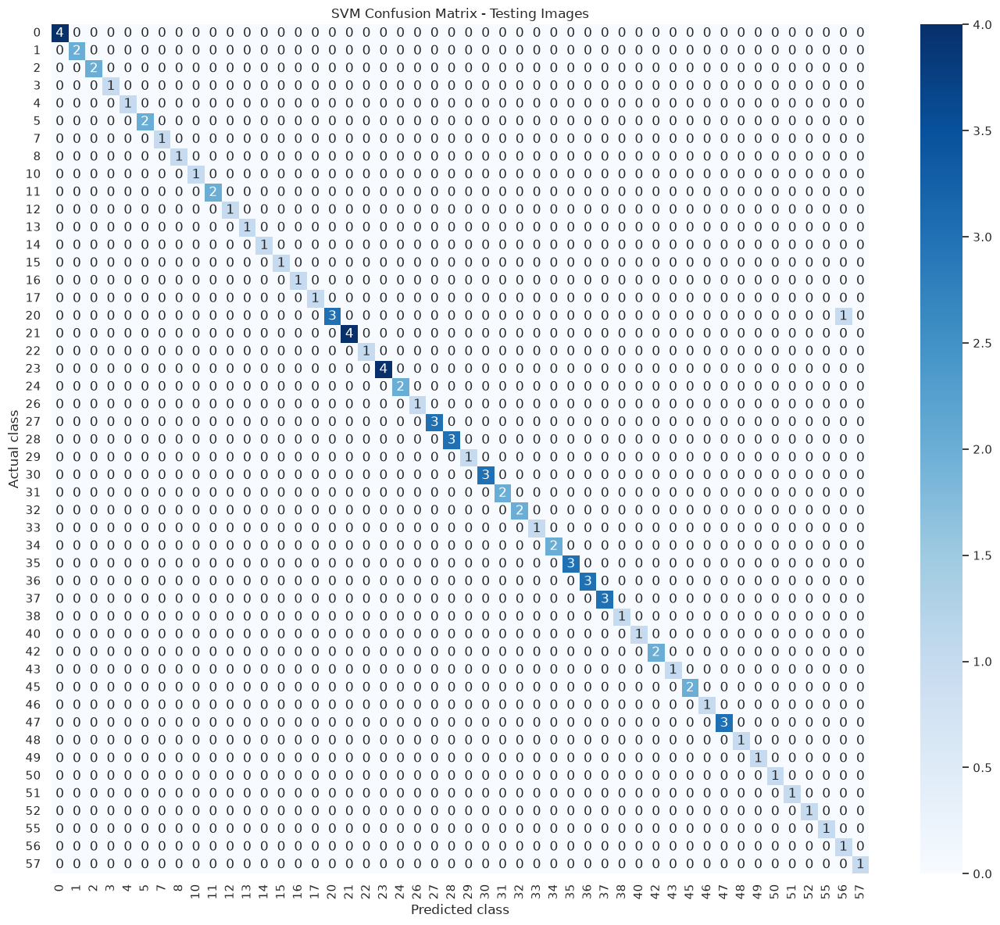

In [22]:
testing_classes = np.unique(y_testing_true)
testing_cm = confusion_matrix(
    y_testing_true,
    y_testing_pred,
    labels=testing_classes,
)

plt.figure(figsize=(14, 12))
sns.heatmap(
    testing_cm,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=testing_classes,
    yticklabels=testing_classes,
)
plt.title(f"{best_classifier_name} Confusion Matrix - Testing Images")
plt.xlabel("Predicted class")
plt.ylabel("Actual class")
plt.tight_layout()
plt.show()

## 18. Save the final model and metadata

In [23]:
joblib.dump(final_model, FINAL_MODEL_FILE)

metadata = {
    "classifier": "SVM",
    "parameters": best_parameters,
    "parameter_selection": "20% stratified validation split",
    "selection_metric": "Macro F1, followed by accuracy and prediction time",
    "hog_features": EXPECTED_HOG_FEATURES,
    "hog_configuration": {
        "roi_size": pipeline_features.HOG_ROI_SIZE,
        "roi_note": "ROI cropped to its mask's bounding box, then resized (Lanczos) to this fixed square canvas",
        "orientations": pipeline_features.HOG_ORIENTATIONS,
        "pixels_per_cell": list(pipeline_features.HOG_PIXELS_PER_CELL),
        "cells_per_block": list(pipeline_features.HOG_CELLS_PER_BLOCK),
        "block_norm": pipeline_features.HOG_BLOCK_NORM,
        "transform_sqrt": True,
        "channel_axis": -1,
    },
    "training_samples": int(len(X_train_full)),
    "public_test_metrics": {
        name: float(value)
        for name, value in public_test_scores.items()
    },
    "final_testing_feature_file": str(INPUT_TEST_FEATURE_FILE),
    "final_testing_samples": int(len(X_input_test)),
    "testing_metrics": {
        name: float(value)
        for name, value in testing_scores.items()
    },
}

with FINAL_METADATA_FILE.open("w", encoding="utf-8") as stream:
    json.dump(metadata, stream, indent=2, ensure_ascii=False)

print("Saved final SVM model:", FINAL_MODEL_FILE.resolve())
print("Saved SVM metadata:", FINAL_METADATA_FILE.resolve())
print("Saved SVM validation table:", SVM_VALIDATION_FILE.resolve())

Saved final SVM model: /home/hongye/projects/traffic-sign-recognition/models/svm_hog_final_classifier.joblib
Saved SVM metadata: /home/hongye/projects/traffic-sign-recognition/models/svm_hog_final_classifier_metadata.json
Saved SVM validation table: /home/hongye/projects/traffic-sign-recognition/results/svm_parameter_validation_results.csv


## 19. Display all final testing results

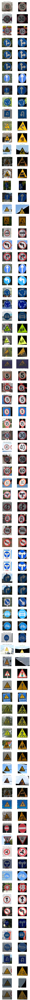

In [24]:
def display_all_results():
    total_results = len(recognition_visuals)

    if total_results == 0:
        raise RuntimeError("No recognition results are available.")

    fig, axes = plt.subplots(
        total_results,
        2,
        figsize=(6, 2.2 * total_results),
        squeeze=False,
        facecolor="white",
    )

    for row_index, result in enumerate(recognition_visuals):
        # Original image
        axes[row_index, 0].imshow(result["original"])
        axes[row_index, 0].set_title(
            f"Original - {result['filename']}",
            color="black",
            fontsize=8,
        )
        axes[row_index, 0].set_facecolor("white")
        axes[row_index, 0].axis("off")

        # Recognition status
        status = (
            "Correct" if result["correct"] is True
            else "Wrong" if result["correct"] is False
            else "Unknown"
        )

        colour = (
            "green" if status == "Correct"
            else "red" if status == "Wrong"
            else "darkorange"
        )

        # Segmented image and prediction
        axes[row_index, 1].imshow(result["segmented"])
        axes[row_index, 1].set_title(
            f"{result['predicted_name']}\n"
            f"Class {result['predicted_class']} - {status}",
            color=colour,
            fontsize=8,
        )
        axes[row_index, 1].set_facecolor("white")
        axes[row_index, 1].axis("off")

    plt.tight_layout()
    plt.show()


display_all_results()